In [80]:
#Dependencies
import pandas as pd
import csv
import matplotlib.pyplot as plt
from scipy.stats import linregress
pd.set_option('display.max_rows',None)

In [81]:
covid=pd.read_csv('Resources/COVID19_data.csv')
covid

,date,location,total_cases,new_cases,total_deaths,new_deaths
0,31-12-19,Afghanistan,0.0,0.0,0.0,0.0
1,01-01-20,Afghanistan,0.0,0.0,0.0,0.0
2,02-01-20,Afghanistan,0.0,0.0,0.0,0.0
3,03-01-20,Afghanistan,0.0,0.0,0.0,0.0
4,04-01-20,Afghanistan,0.0,0.0,0.0,0.0
5,05-01-20,Afghanistan,0.0,0.0,0.0,0.0
6,06-01-20,Afghanistan,0.0,0.0,0.0,0.0
7,07-01-20,Afghanistan,0.0,0.0,0.0,0.0
8,08-01-20,Afghanistan,0.0,0.0,0.0,0.0
9,09-01-20,Afghanistan,0.0,0.0,0.0,0.0


In [3]:
covid=covid.rename(columns={'location':'Country','date':'Date','total_cases':'Total_cases','total_deaths':'Total_deaths'})
covid

,Date,Country,Total_cases,new_cases,Total_deaths,new_deaths
0,31-12-19,Afghanistan,0.0,0.0,0.0,0.0
1,01-01-20,Afghanistan,0.0,0.0,0.0,0.0
2,02-01-20,Afghanistan,0.0,0.0,0.0,0.0
3,03-01-20,Afghanistan,0.0,0.0,0.0,0.0
4,04-01-20,Afghanistan,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
26350,23-06-20,Zimbabwe,512.0,23.0,6.0,0.0
26351,24-06-20,Zimbabwe,525.0,13.0,6.0,0.0
26352,25-06-20,Zimbabwe,530.0,5.0,6.0,0.0
26353,26-06-20,Zimbabwe,551.0,21.0,6.0,0.0


In [4]:
covid_df=covid[['Date','Country','Total_cases','Total_deaths']]
covid_df


,Date,Country,Total_cases,Total_deaths
0,31-12-19,Afghanistan,0.0,0.0
1,01-01-20,Afghanistan,0.0,0.0
2,02-01-20,Afghanistan,0.0,0.0
3,03-01-20,Afghanistan,0.0,0.0
4,04-01-20,Afghanistan,0.0,0.0
...,...,...,...,...
26350,23-06-20,Zimbabwe,512.0,6.0
26351,24-06-20,Zimbabwe,525.0,6.0
26352,25-06-20,Zimbabwe,530.0,6.0
26353,26-06-20,Zimbabwe,551.0,6.0


In [5]:
# covid_df_country=[covid_df.loc[covid_df['Country']==value] for value in covid_df['Country']]
# covid_df_country
# last_date=covid_df_country[0].iloc[-1,0]
# last_date

In [6]:
#changing the Date format from object to date for further processing
covid_df.loc[:,'Date']=pd.to_datetime(covid_df.loc[:,"Date"])
covid_df.dtypes


/Users/nazila-entezari/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Date            datetime64[ns]
Country                 object
Total_cases            float64
Total_deaths           float64
dtype: object

In [7]:
#getting the cumulative cases and deaths based on the latest date for each country
latest_df=covid_df.loc[covid_df.groupby('Country').Date.idxmax()]
latest_df

,Date,Country,Total_cases,Total_deaths
154,2020-12-06,Afghanistan,22890.0,426.0
265,2020-12-06,Albania,1385.0,35.0
440,2020-12-06,Algeria,10589.0,741.0
546,2020-12-06,Andorra,852.0,51.0
644,2020-12-06,Angola,118.0,5.0
...,...,...,...,...
25997,2020-12-06,Vietnam,332.0,0.0
26060,2020-12-06,Western Sahara,23.0,1.0
26139,2020-12-06,Yemen,591.0,136.0
26240,2020-12-06,Zambia,1252.0,10.0


In [8]:
total_cases_per_country=latest_df.iloc[:,1:3].set_index('Country')
total_cases_per_country

,Total_cases
Country,
Afghanistan,22890.0
Albania,1385.0
Algeria,10589.0
Andorra,852.0
Angola,118.0
...,...
Vietnam,332.0
Western Sahara,23.0
Yemen,591.0


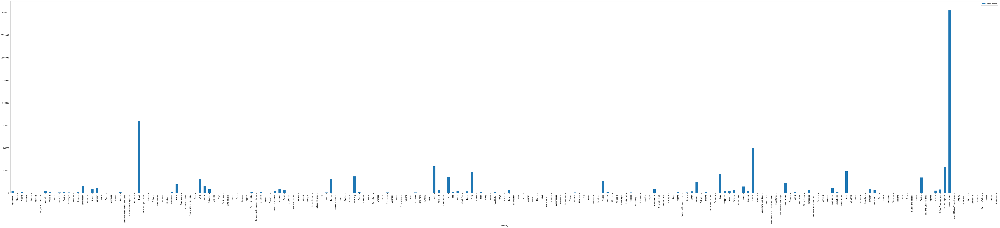

In [9]:
total_cases_per_country.plot(kind="bar",figsize=(100,20))

In [10]:
total_deaths_per_country=latest_df.iloc[:,[1,3]].set_index('Country')
total_deaths_per_country

,Total_deaths
Country,
Afghanistan,426.0
Albania,35.0
Algeria,741.0
Andorra,51.0
Angola,5.0
...,...
Vietnam,0.0
Western Sahara,1.0
Yemen,136.0


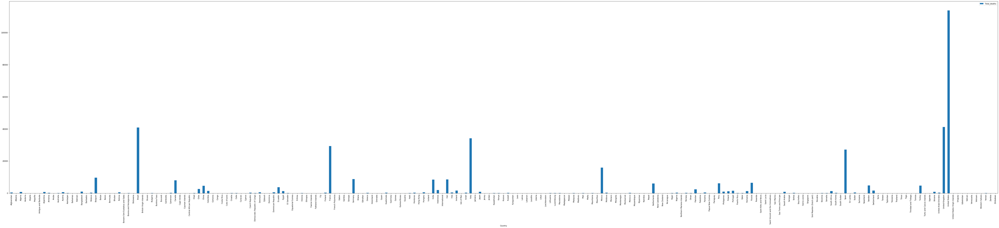

In [11]:
total_deaths_per_country.plot(kind="bar",figsize=(100,20))

In [12]:
top10_cases_per_country=total_cases_per_country['Total_cases'].sort_values(ascending=False).iloc[:10]
top10_cases_per_country

Country
United States     2023347.0
Brazil             802828.0
Russia             502436.0
India              297535.0
United Kingdom     291409.0
Spain              243209.0
Italy              236142.0
Peru               214788.0
Germany            185674.0
Iran               180176.0
Name: Total_cases, dtype: float64

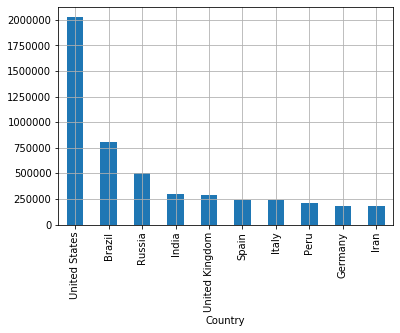

In [13]:
top10_cases_per_country.plot(kind="bar")
plt.grid()

In [14]:
top10_deaths_per_country=total_deaths_per_country['Total_deaths'].sort_values(ascending=False).iloc[:10]
top10_deaths_per_country

Country
United States     113820.0
United Kingdom     41279.0
Brazil             40919.0
Italy              34167.0
France             29346.0
Spain              27136.0
Mexico             15944.0
Belgium             9651.0
Germany             8763.0
Iran                8584.0
Name: Total_deaths, dtype: float64

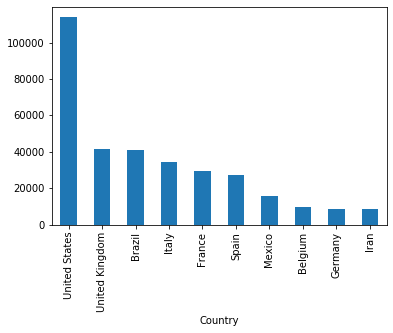

In [15]:
top10_deaths_per_country.plot(kind="bar")


In [16]:
total_per_country=latest_df.iloc[:,1:4].set_index('Country')
total_per_country


,Total_cases,Total_deaths
Country,,
Afghanistan,22890.0,426.0
Albania,1385.0,35.0
Algeria,10589.0,741.0
Andorra,852.0,51.0
Angola,118.0,5.0
...,...,...
Vietnam,332.0,0.0
Western Sahara,23.0,1.0
Yemen,591.0,136.0


In [17]:
total_per_country_indexed=total_per_country.reset_index()
total_per_country_indexed


,Country,Total_cases,Total_deaths
0,Afghanistan,22890.0,426.0
1,Albania,1385.0,35.0
2,Algeria,10589.0,741.0
3,Andorra,852.0,51.0
4,Angola,118.0,5.0
...,...,...,...
206,Vietnam,332.0,0.0
207,Western Sahara,23.0,1.0
208,Yemen,591.0,136.0
209,Zambia,1252.0,10.0


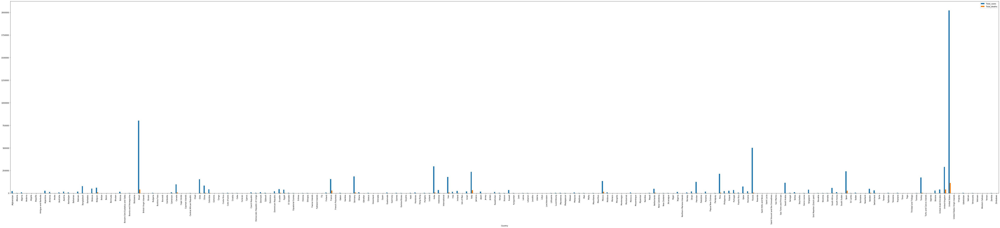

In [18]:
total_per_country.plot(kind="bar",figsize=(100,20))

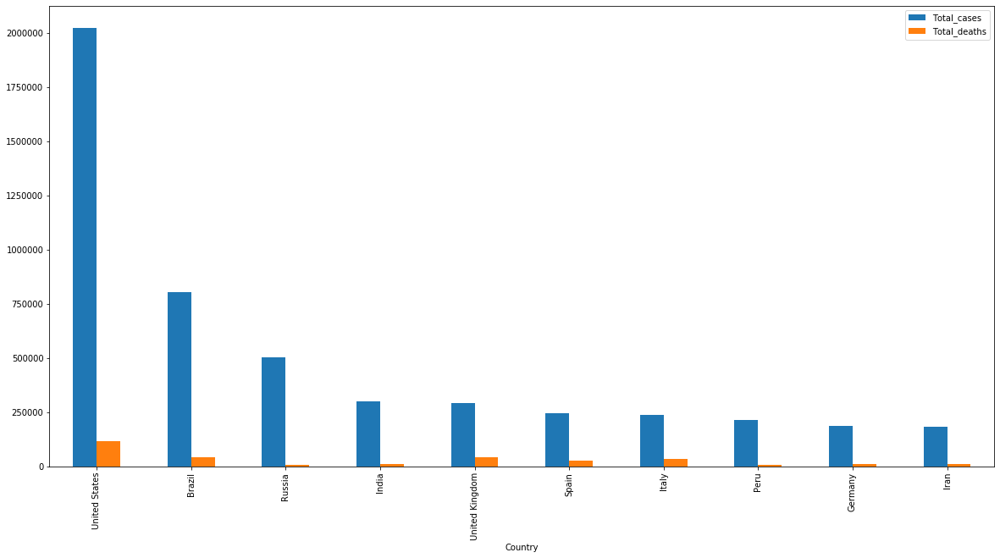

In [19]:
top10_total_per_country=total_per_country.sort_values(by='Total_cases',ascending=False).iloc[:10]
top10_total_per_country.plot(kind='bar',figsize=(20,10))

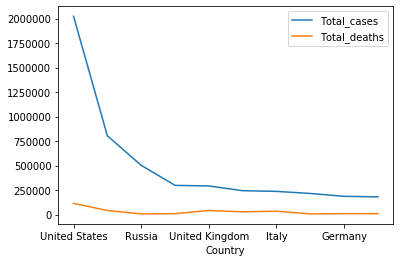

In [50]:
top10_total_per_country.plot(kind='line',by='Date')


In [69]:
new_df=total_per_country_indexed.dropna()

Text(500000, 60000, 'y = 0.06x + 17.6')

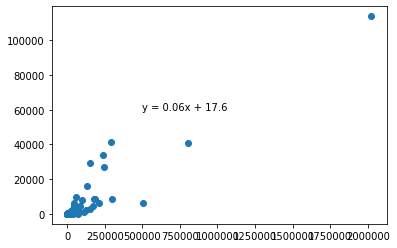

In [70]:
#scatter plot cases vs deaths_per country
x=new_df['Total_cases']
y=new_df['Total_deaths']
plt.scatter(x,y)
#linear regression on cases vs death
(slope, intercept, rvalue, pvalue, stderr) = linregress(x, y)
slope
regress_value=slope*x+intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.annotate(line_eq,(500000,60000))



In [84]:
covid_df["Date"] = pd.to_datetime(covid_df["Date"]).dt.strftime('%Y-%m-%d')
covid_df

/Users/nazila-entezari/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Date,Country,Total_cases,Total_deaths
0,2019-12-31,Afghanistan,0.0,0.0
1,2020-01-01,Afghanistan,0.0,0.0
2,2020-02-01,Afghanistan,0.0,0.0
3,2020-03-01,Afghanistan,0.0,0.0
4,2020-04-01,Afghanistan,0.0,0.0


In [85]:
#COMP: the spread rate over time( adding up all datas for every country and plot it by date) 
grouped_by_date=covid_df.groupby('Date').sum()
print(grouped_by_date).head()



            Total_cases  Total_deaths
Date                                 
2019-12-31         27.0           0.0
2020-01-01         27.0           0.0
2020-01-02      11946.0         259.0
2020-01-03      87042.0        2979.0
2020-01-04     872373.0       43130.0
2020-01-05    3218934.0      233257.0
2020-01-06    6135857.0      371882.0
2020-01-13         60.0           1.0
2020-01-14         60.0           1.0
2020-01-15         61.0           2.0
2020-01-16         61.0           2.0
2020-01-17         66.0           2.0
2020-01-18         83.0           2.0
2020-01-19        219.0           3.0
2020-01-20        239.0           3.0
2020-01-21        392.0           6.0
2020-01-22        534.0          17.0
2020-01-23        631.0          17.0
2020-01-24        897.0          26.0
2020-01-25       1350.0          41.0
2020-01-26       2023.0          56.0
2020-01-27       2820.0          81.0
2020-01-28       4587.0         106.0
2020-01-29       6067.0         132.0
2020-01-30  

AttributeError: 'NoneType' object has no attribute 'head'

In [76]:
grouped_by_date_cases=grouped_by_date[['Total_cases']]

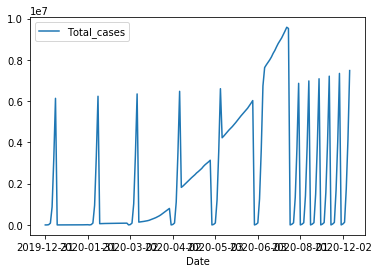

In [77]:
grouped_by_date_cases.plot()

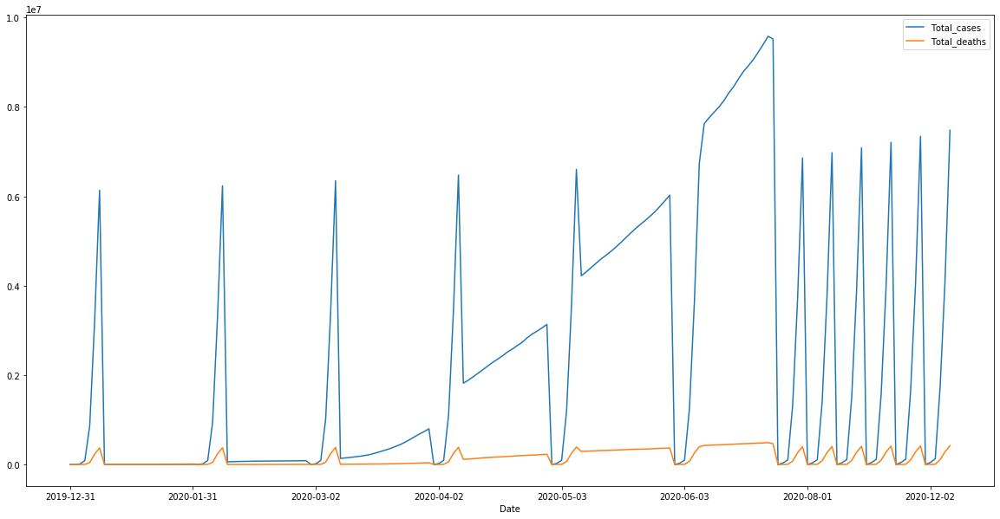

In [72]:
grouped_by_date.plot(kind='line',figsize=(20,10))

In [60]:
#Outbreak evolution for the current 10 most affected countries
grouped_by_date_country=covid_df.groupby(['Country','Date']).sum().sort_values(['Total_cases'],ascending=False).iloc[0:1800,:]
grouped_by_date_country

Total_cases  Total_deaths
Country        Date                                 
United States  2020-06-27    2467837.0      125039.0
               2020-06-26    2422310.0      124416.0
               2020-06-25    2381361.0      121979.0
               2020-06-24    2347022.0      121228.0
               2020-06-23    2312302.0      120402.0
...                                ...           ...
Turkey         2020-09-04      38226.0         812.0
United Kingdom 2020-04-04      38168.0        4461.0
Ecuador        2020-05-28      38103.0        3275.0
Portugal       2020-06-19      38089.0        1524.0
Kuwait         2020-06-19      38074.0         308.0

[1800 rows x 2 columns]

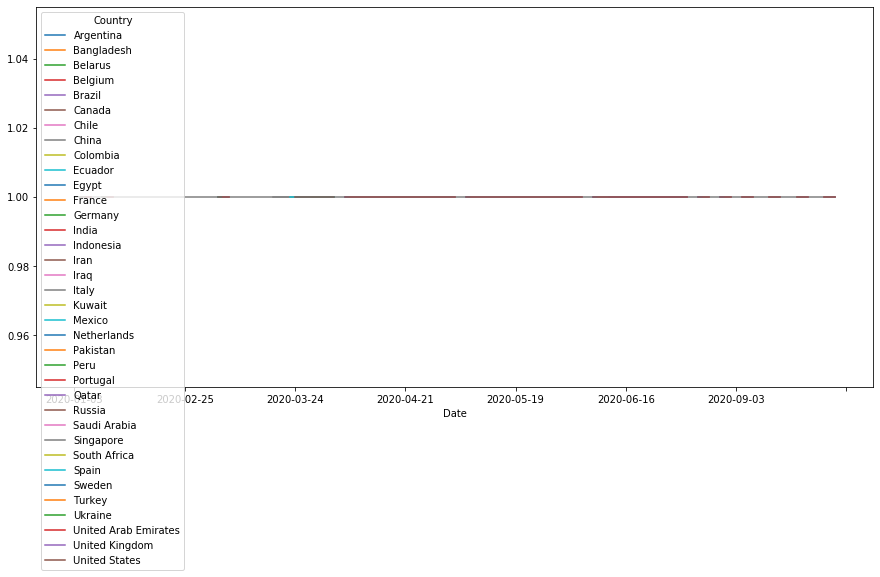

In [73]:
# plot data
fig, ax = plt.subplots(figsize=(15,7))
# use unstack()
grouped_by_date_country.groupby(['Date','Country']).count()['Total_cases'].unstack().plot(ax=ax)

In [26]:
#COMP: the death rate vs total number of cases (one bar graph)


In [27]:
#sort by the extreme countries on total cases


In [28]:
#boxplots and outliers per country


In [29]:
#sort by the extreme countries on the death rate 


In [30]:
#boxplots and outliers per country


In [31]:
#pie chart for deaths vs cases global


In [32]:
# geolocation map for cumulative number of cases in the beginning and the end